# Detecting Diabetes

Dataset: [Diabetes Dataset](https://www.kaggle.com/datasets/asinow/diabetes-dataset)

The goal is to determine whether a person has diabetes based on the provided dataset.

In [1]:
import requests
import pandas as pd
import numpy as np
import zipfile
import io
import optuna
import mlflow
import shap
import matplotlib.pyplot as plt

from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    ConfusionMatrixDisplay,
    PrecisionRecallDisplay,
    average_precision_score,
    precision_recall_curve,
)
from pathlib import Path
from ydata_profiling import ProfileReport

Load the dataset

In [2]:
data_path = Path.cwd().parent / "data" / "diabetes_dataset.csv"

if data_path.exists():
    data = pd.read_csv(data_path)
else:
    url = "https://www.kaggle.com/api/v1/datasets/download/asinow/diabetes-dataset"
    response = requests.get(url)
    with zipfile.ZipFile(io.BytesIO(response.content), "r") as zip_ref:
        zip_ref.extract("diabetes_dataset.csv", "../data")
        with zip_ref.open("diabetes_dataset.csv") as csv_file:
            data = pd.read_csv(csv_file)

data.head()

,Age,Pregnancies,BMI,Glucose,BloodPressure,HbA1c,LDL,HDL,Triglycerides,WaistCircumference,HipCircumference,WHR,FamilyHistory,DietType,Hypertension,MedicationUse,Outcome
0,69,5,28.39,130.1,77.0,5.4,130.4,44.0,50.0,90.5,107.9,0.84,0,0,0,1,0
1,32,1,26.49,116.5,72.0,4.5,87.4,54.2,129.9,113.3,81.4,1.39,0,0,0,0,0
2,89,13,25.34,101.0,82.0,4.9,112.5,56.8,177.6,84.7,107.2,0.79,0,0,0,1,0
3,78,13,29.91,146.0,104.0,5.7,50.7,39.1,117.0,108.9,110.0,0.99,0,0,0,1,1
4,38,8,24.56,103.2,74.0,4.7,102.5,29.1,145.9,84.1,92.8,0.91,0,1,0,0,0


## Simple EDA

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9538 entries, 0 to 9537
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Age                 9538 non-null   int64  
 1   Pregnancies         9538 non-null   int64  
 2   BMI                 9538 non-null   float64
 3   Glucose             9538 non-null   float64
 4   BloodPressure       9538 non-null   float64
 5   HbA1c               9538 non-null   float64
 6   LDL                 9538 non-null   float64
 7   HDL                 9538 non-null   float64
 8   Triglycerides       9538 non-null   float64
 9   WaistCircumference  9538 non-null   float64
 10  HipCircumference    9538 non-null   float64
 11  WHR                 9538 non-null   float64
 12  FamilyHistory       9538 non-null   int64  
 13  DietType            9538 non-null   int64  
 14  Hypertension        9538 non-null   int64  
 15  MedicationUse       9538 non-null   int64  
 16  Outcom

In [4]:
profile = ProfileReport(data, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Model training and hyperparameters tuning 

Initializing **MLFlow** tracking server 

In [4]:
mlflow.set_tracking_uri("http://localhost:5000")
mlflow.set_experiment("diabetes-sunmait")

<Experiment: artifact_location='mlflow-artifacts:/783430136068858026', creation_time=1741002964003, experiment_id='783430136068858026', last_update_time=1741002964003, lifecycle_stage='active', name='diabetes-sunmait', tags={}>

Split the data to tr train, validation and test sets. The target variable is the column "Outcome" and the rest of the columns are the features.

In [5]:
X = data.drop(columns=["Outcome"])
y = data["Outcome"]
X, X_test, y, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [6]:
def get_best_threshold(y_true, y_pred):
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred)
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-10)

    best_idx = np.argmax(f1_scores)
    best_threshold = thresholds[best_idx]
    best_f1 = f1_scores[best_idx]
    return best_f1, best_threshold

Creating objective function for **Optuna** to optimize the hyperparameters of the model. 

In [ ]:
def objective(trial):
    with mlflow.start_run(nested=True):
        params = {
            "depth": trial.suggest_int("depth", 1, 15),
            "colsample_bylevel": trial.suggest_float(
                "colsample_bylevel", 0.01, 0.1, log=True
            ),
            "subsample": trial.suggest_float("subsample", 0.6, 1.0, step=0.05),
            "iterations": trial.suggest_int("iterations", 10, 200, step=10),
            "learning_rate": trial.suggest_float(
                "learning_rate", 0.00001, 0.1, log=True
            ),
            "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1e-4, 10, log=True),
        }
        model = CatBoostClassifier(random_state=42, **params)

        model.fit(X_train, y_train)
        y_pred_proba = model.predict_proba(X_val)[:, 1]
        score = average_precision_score(y_val, y_pred_proba)

        f1, threshold = get_best_threshold(y_val, y_pred_proba)

        mlflow.log_params(params)
        mlflow.log_param("threshold", threshold)
        mlflow.log_metric("AP", score)
        mlflow.log_metric("F1", f1)

    return score

In [ ]:
with mlflow.start_run(run_name="catboost with optuna") as run:
    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=200)
    params = study.best_params

    model = CatBoostClassifier(random_state=42, **params)

    model.fit(X, y)
    y_pred_proba = model.predict_proba(X_test)[:, 1]

    ap = average_precision_score(y_test, y_pred_proba)
    f1, threshold = get_best_threshold(y_test, y_pred_proba)
    y_pred = np.where(y_pred_proba > threshold, 1, 0)
    metrics = {"AP": ap, "F1": f1}

    pr_curve = PrecisionRecallDisplay.from_predictions(
        y_test, y_pred_proba, plot_chance_level=True
    ).figure_
    cm = ConfusionMatrixDisplay.from_predictions(y_test, y_pred).figure_

    mlflow.log_figure(pr_curve, "pr_curve.png")
    mlflow.log_figure(cm, "confusion_matrix.png")
    mlflow.log_params(params)
    mlflow.log_param("threshold", threshold)
    mlflow.log_metrics(metrics)
    mlflow.catboost.log_model(
        cb_model=model,
        artifact_path="cb_artifacts",
        input_example=X,
        registered_model_name="catboost",
    )

In [ ]:
model_uri = "models:/catboost/1"
model = mlflow.catboost.load_model(model_uri)

## Model explanation with **Shap**

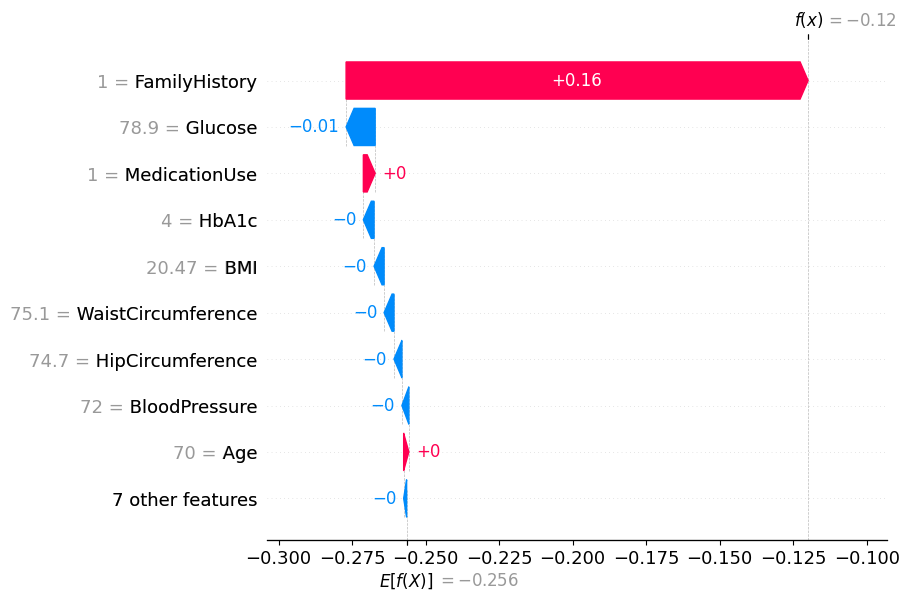

In [20]:
explainer = shap.TreeExplainer(model)
shap_values = explainer(X_test)

fig, ax = plt.subplots()
shap.plots.waterfall(shap_values[3])

### SHAP Analysis: Why the Model Made This Prediction

### 1. Overall Interpretation of the Plot  
- The expected prediction value \( E[f(X)] = -0.256 \) represents the model’s average prediction across the test dataset.  
- The final prediction for this specific sample is \( f(x) = -0.12 \), meaning the probability of diabetes for this patient is higher than the dataset average.  
- **Red bars** indicate features that increase the prediction, raising the probability of diabetes.  
- **Blue bars** indicate features that lower the prediction, reducing the probability of diabetes.  

### 2. Breakdown of Feature Contributions  
- **FamilyHistory = 1**  contributes **+0.16** to the prediction, making it the most significant factor increasing the probability of diabetes.  
- **Glucose = 78.9** slightly reduces the prediction by **-0.01**, indicating a relatively low glucose level.  
- **MedicationUse = 1** has almost no effect on the prediction.  
- **HbA1c = 4**, **BMI = 20.47**, **WaistCircumference = 75.1**, **HipCircumference = 74.7**, **BloodPressure = 72**, and **Age = 70** mostly decrease the probability of diabetes, but their contributions are very small.  

### 3. Conclusion  
The main reason the model predicted **a relatively low probability of diabetes** is that **almost all of the patient’s parameters are within a normal range**, except for **a family history of diabetes**, which slightly increases the risk.